<img src="Bancounoima.jpg"/>

<center><h1 style="color:#000080">Poyecto final Machine Learning</h1> </center> 
<center><h5 style="color:#00008B">Universidad Castro Carazo</h1> </center> 
<center><h5 style="color:#00008B">Estudiante: Yuliana Vásquez Pacheco</h1> </center>
<center><h6 style="color:##ADFF2F">IC-2023</h1> </center> 
</br>
<p style= "text-align:justify"> Durante el último año, Banco Uno ha detectado la materialización del riesgo
de incumplimiento de los compromisos financieros por parte de los clientes,
que han tramitado algún tipo de préstamo en la institución. Lo anterior expone a Banco Uno a un detrimento en la calificación crediticia del ante las autoridades reguladoras, motivo que podría generar la perdida de clientes o negocios en un futuro, razón por la cual es importante resolver el problema y de esta forma mantener el estatus ante los entes reguladores. Luego de un detallado análisis del escenario antes planteado, se llegó a la conclusión de que es necesario un mecanismo que permita identificar el monto a prestar a un cliente, o en su efecto si se debe otorgar el crédito o no, para lo cual se ha decidido emprender un proyecto de ciencia de datos cuyo objetivo es diseñar e implementar una solución mediante el cual se
facilite la toma de decisiones respecto a al proceso de otorgamiento de créditos. 

En razón de lo anterior, se efectua la exploración del set de datos que proporcionará la entidad bancaria, esto para obtener insumos suficientes para la toma de desiciones sobre si un crédito debe ser otorgado o no. </p>
</br>


<h2 style=color: #008B8B> Carga y examinado  los set de datos </h2>

In [1]:
from sqlalchemy import create_engine
import pymysql
import pandas as pd
import matplotlib as mpl
#se descragn las librerías

In [2]:
df = pd.read_csv("BancoUno.csv")

df.head(5) 
#Este documento se cargó diretcamente desde un archivo csv

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,20000,female,university,1,24,2,2,-1,-1,-2,...,0,0,0,0,689,0,0,0,0,default
1,120000,female,university,2,26,-1,2,0,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,default
2,90000,female,university,2,34,0,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,not default
3,50000,female,university,1,37,0,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,not default
4,50000,male,university,1,57,-1,0,-1,0,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,not default


<h2 style=color: #008B8B> Datos y dominio de estos </h2>
</br>

 <p style= "text-align:justify"> Esta investigación empleó una variable binaria, pago predeterminado (Sí = 1, No = 0), como variable de respuesta. Este estudio revisó la literatura y utilizó las siguientes 23 variables como variables explicativas:

LIMIT_BAL: Monto del crédito otorgado.

SEX: Género (1 = masculino; 2 = femenino).

EDUCATION: Educación (1 = posgrado; 2 = universidad; 3 = bachillerato; 0, 4, 5, 6 = otros).

MARRIAGE: Estado civil (1 = casado; 2 = soltero; 3 = divorciado; 0 = otros).

AGE: Edad (año).

PAY_0 - PAY_6: Historial de pagos pasados. Realizamos un seguimiento de los últimos registros de pagos mensuales (desde Abril a septiembre de 2005) de la siguiente manera: PAY_0 = el estado de reembolso en septiembre de 2005; PAY_2 = el estado de reembolso en agosto de 2005; . . .; PAY_6 = el estado de reembolso en abril de 2005. 2: Sin consumo; -1: pagado en su totalidad; 0: El uso de crédito renovable; 1 = retraso en el pago por un mes; 
La escala de medición para el estado de reembolso es:
    2 = retraso en el pago de dos meses
    8 = retraso en el pago de ocho meses
    9 = retraso en el pago de nueve meses o más.

BILL_AMT1-BILL_AMT6: Monto del extracto de la factura (dólar NT). BILL_AMT1 = monto del extracto de la factura en Septiembre de 2005; BILL_AMT2 = monto del estado de cuenta en agosto de 2005; . . .; BILL_AMT6 = cantidad de estado de cuenta en abril de 2005.

PAY_AMT1-PAY_AMT6: Monto del pago anterior (dólar NT). PAY_AMT1 = monto pagado en septiembre, 2005; PAY_AMT2 = monto pagado en agosto de 2005; . . .; PAY_AMT6 = monto pagado en abril de 2005.

Y: comportamiento del cliente; Y = 0 entonces no predeterminado, Y = 1 luego predeterminado "</p>
</br>
    

In [3]:
df = df.rename(columns={'LIMIT_BAL': 'MONTO_CREDITO', 'SEX': 'GENERO', 'EDUCATION': 'EDUCACION', 'MARRIAGE': 'ESTADO_CIVIL',
                        'AGE': 'EDAD', 'PAY_0': 'REMBOLSO_SEPTIEMBRE', 'PAY_2': 'REMBOLSO_AGOSTO', 'PAY_3': 'REMBOLSO_JULIO',
                        'PAY_4': 'REMBOLSO_JUNIO', 'PAY_5': 'REMBOLSO_MAYO', 'PAY_6': 'REMABOLSO_ABRIL', 'BILL_AMT1': 'FACT_SEPT',
                        'BILL_AMT2': 'FACT_AGOST', 'BILL_AMT3': 'FACT_JUL', 'BILL_AMT4': 'FACT_JUN', 'BILL_AMT5': 'FACT_MAY',
                        'BILL_AMT6': 'FACT_ABRIL', 'PAY_AMT1': 'PAGO_SEPT', 'PAY_AMT2': 'PAGO_AGOST', 'PAY_AMT3': 'PAGO_JUL',
                        'PAY_AMT4': 'PAGO_JUN', 'PAY_AMT5': 'PAGO_MAY', 'PAY_AMT6': 'PAGO_ABR','defaultpaymentnextmonth':'MESPAGO_PORDEFECTO' })
df.drop([0], axis=0, inplace=True)
df.reset_index(inplace=True, drop=False)
print(df)
#Se renombran los encabezados de las columanas según lo indicado, se elimina la primera fila con los anteriores nombres

      index MONTO_CREDITO  GENERO        EDUCACION ESTADO_CIVIL EDAD  \
0         1        120000  female       university            2   26   
1         2         90000  female       university            2   34   
2         3         50000  female       university            1   37   
3         4         50000    male       university            1   57   
4         5         50000    male  graduate school            2   37   
...     ...           ...     ...              ...          ...  ...   
3663   3664        220000  female       university            1   32   
3664   3665         70000  female       university            2   34   
3665   3666        120000    male       university            2   37   
3666   3667        180000  female       university            2   32   
3667   3668         50000  female      high school            1   57   

     REMBOLSO_SEPTIEMBRE REMBOLSO_AGOSTO REMBOLSO_JULIO REMBOLSO_JUNIO  ...  \
0                     -1               2              0 

In [4]:
df.drop(['index'], axis=1, inplace=True)
#se elimina el encabezdo index

In [5]:
df.head(5)

,MONTO_CREDITO,GENERO,EDUCACION,ESTADO_CIVIL,EDAD,REMBOLSO_SEPTIEMBRE,REMBOLSO_AGOSTO,REMBOLSO_JULIO,REMBOLSO_JUNIO,REMBOLSO_MAYO,...,FACT_JUN,FACT_MAY,FACT_ABRIL,PAGO_SEPT,PAGO_AGOST,PAGO_JUL,PAGO_JUN,PAGO_MAY,PAGO_ABR,default payment next month
0,120000,female,university,2,26,-1,2,0,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,default
1,90000,female,university,2,34,0,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,not default
2,50000,female,university,1,37,0,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,not default
3,50000,male,university,1,57,-1,0,-1,0,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,not default
4,50000,male,graduate school,2,37,0,0,0,0,0,...,19394,19619,20024,2500,1815,657,1000,1000,800,not default


<h2 style=color: #008B8B> Aplicando Pandas Profiling </h2>
</br>
<p style= "text-align:justify"> Esto permitirá generar un reporte mediante el cual, puede analizarse la data de manera más detallada para: 
    
 <li>Limpieza de Datos.
 <li>Revisión de valores nulos y faltantes. 
 <li>Reducción de datos (eliminación de observaciones repetidas).
</p>
</br>

In [6]:
import pandas_profiling

C:\Users\yulia\AppData\Local\Temp\ipykernel_5544\1591302161.py:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


In [7]:
pip install ydata-profiling


Defaulting to user installation because normal site-packages is not writeableNote: you may need to restart the kernel to use updated packages.



In [8]:
import ydata_profiling


In [9]:
ydata_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3668 entries, 0 to 3667
Data columns (total 24 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   MONTO_CREDITO               3668 non-null   object
 1   GENERO                      3668 non-null   object
 2   EDUCACION                   3668 non-null   object
 3   ESTADO_CIVIL                3668 non-null   object
 4   EDAD                        3668 non-null   object
 5   REMBOLSO_SEPTIEMBRE         3668 non-null   object
 6   REMBOLSO_AGOSTO             3668 non-null   object
 7   REMBOLSO_JULIO              3668 non-null   object
 8   REMBOLSO_JUNIO              3668 non-null   object
 9   REMBOLSO_MAYO               3668 non-null   object
 10  REMABOLSO_ABRIL             3668 non-null   object
 11  FACT_SEPT                   3668 non-null   object
 12  FACT_AGOST                  3668 non-null   object
 13  FACT_JUL                    3668 non-null   obje

In [11]:
df.describe()

,MONTO_CREDITO,GENERO,EDUCACION,ESTADO_CIVIL,EDAD,REMBOLSO_SEPTIEMBRE,REMBOLSO_AGOSTO,REMBOLSO_JULIO,REMBOLSO_JUNIO,REMBOLSO_MAYO,...,FACT_JUN,FACT_MAY,FACT_ABRIL,PAGO_SEPT,PAGO_AGOST,PAGO_JUL,PAGO_JUN,PAGO_MAY,PAGO_ABR,default payment next month
count,3668,3668,3668,3668,3668,3668,3668,3668,3668,3668,...,3668,3668,3668,3668,3668,3668,3668,3668,3668,3668
unique,63,3,5,5,53,10,11,11,10,9,...,2009,1984,1948,1147,1130,1041,1035,1039,971,3
top,50000,female,university,2,29,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,not default
freq,453,2129,1643,2045,214,1741,1901,1875,1995,1996,...,423,459,531,666,708,797,807,826,948,2873


In [12]:
type(df)

pandas.core.frame.DataFrame

In [13]:
df.drop_duplicates(subset=None, keep='first', inplace=False, ignore_index=False)


,MONTO_CREDITO,GENERO,EDUCACION,ESTADO_CIVIL,EDAD,REMBOLSO_SEPTIEMBRE,REMBOLSO_AGOSTO,REMBOLSO_JULIO,REMBOLSO_JUNIO,REMBOLSO_MAYO,...,FACT_JUN,FACT_MAY,FACT_ABRIL,PAGO_SEPT,PAGO_AGOST,PAGO_JUL,PAGO_JUN,PAGO_MAY,PAGO_ABR,default payment next month
0,120000,female,university,2,26,-1,2,0,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,default
1,90000,female,university,2,34,0,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,not default
2,50000,female,university,1,37,0,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,not default
3,50000,male,university,1,57,-1,0,-1,0,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,not default
4,50000,male,graduate school,2,37,0,0,0,0,0,...,19394,19619,20024,2500,1815,657,1000,1000,800,not default
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2393,130000,female,university,2,24,1,-2,-1,-1,-1,...,-3,998,937,0,3372,0,1001,939,1013,not default
2394,110000,female,high school,1,27,0,0,0,0,0,...,47316,47175,47141,2326,3000,1807,1698,1911,1808,not default
2395,200000,male,university,1,29,0,0,0,2,2,...,48367,49366,47539,2078,3900,1900,1904,12,5224,not default
2396,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month


In [14]:
profile = pandas_profiling.ProfileReport(df) #se aplica a la base de datos

In [15]:
profile.to_file('informe.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [16]:
ydata_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [17]:
print(df.columns)

Index(['MONTO_CREDITO', 'GENERO', 'EDUCACION', 'ESTADO_CIVIL', 'EDAD',
       'REMBOLSO_SEPTIEMBRE', 'REMBOLSO_AGOSTO', 'REMBOLSO_JULIO',
       'REMBOLSO_JUNIO', 'REMBOLSO_MAYO', 'REMABOLSO_ABRIL', 'FACT_SEPT',
       'FACT_AGOST', 'FACT_JUL', 'FACT_JUN', 'FACT_MAY', 'FACT_ABRIL',
       'PAGO_SEPT', 'PAGO_AGOST', 'PAGO_JUL', 'PAGO_JUN', 'PAGO_MAY',
       'PAGO_ABR', 'default payment next month'],
      dtype='object')


In [18]:
df['MONTO_CREDITO'].unique()


array(['120000', '90000', '50000', '500000', '100000', '140000', '20000',
       '200000', '260000', '630000', '70000', '250000', '320000',
       '360000', '180000', '130000', '450000', '60000', '230000',
       '160000', '280000', '10000', '40000', '210000', '150000', '380000',
       '310000', '400000', '80000', '290000', '340000', '300000', '30000',
       '240000', '470000', '480000', '350000', '330000', '110000',
       '420000', '170000', '370000', '270000', '220000', '190000',
       '510000', '460000', '440000', '410000', '490000', '390000',
       '580000', '600000', '620000', '610000', '700000', '670000',
       '680000', '430000', '550000', '540000', '1000000', 'LIMIT_BAL'],
      dtype=object)

In [19]:
df_original = df.copy()
df = df[df['MONTO_CREDITO'] != 'LIMIT_BAL'] #como el dato 'LIMIT_BAL' no es numérico en la fila  'MONTO_CREDITO' 
#y esto estaba generando un error, se elimina dicho dato y antes de eso se guarda un copia del DF en caso de que haya algún error al borrar

In [20]:
df.loc[:,['MONTO_CREDITO', 'EDAD','REMBOLSO_SEPTIEMBRE', 'REMBOLSO_AGOSTO', 'REMBOLSO_JULIO',
       'REMBOLSO_JUNIO', 'REMBOLSO_MAYO', 'REMABOLSO_ABRIL', 'FACT_SEPT',
       'FACT_AGOST', 'FACT_JUL', 'FACT_JUN', 'FACT_MAY', 'FACT_ABRIL',
       'PAGO_SEPT', 'PAGO_AGOST', 'PAGO_JUL', 'PAGO_JUN', 'PAGO_MAY',
       'PAGO_ABR']] = df[['MONTO_CREDITO','EDAD',
       'REMBOLSO_SEPTIEMBRE', 'REMBOLSO_AGOSTO', 'REMBOLSO_JULIO',
       'REMBOLSO_JUNIO', 'REMBOLSO_MAYO', 'REMABOLSO_ABRIL', 'FACT_SEPT',
       'FACT_AGOST', 'FACT_JUL', 'FACT_JUN', 'FACT_MAY', 'FACT_ABRIL',
       'PAGO_SEPT', 'PAGO_AGOST', 'PAGO_JUL', 'PAGO_JUN', 'PAGO_MAY',
       'PAGO_ABR']].astype("int")

#Se utiliza loc[:, ...], para asegurar que la asignación se realice en el DataFrame original en lugar de una copia y evitar una advertencia que se tenía al respecto

C:\Users\yulia\AppData\Local\Temp\ipykernel_5544\1376686415.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:,['MONTO_CREDITO', 'EDAD','REMBOLSO_SEPTIEMBRE', 'REMBOLSO_AGOSTO', 'REMBOLSO_JULIO',


In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3667 entries, 0 to 3667
Data columns (total 24 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   MONTO_CREDITO               3667 non-null   object
 1   GENERO                      3667 non-null   object
 2   EDUCACION                   3667 non-null   object
 3   ESTADO_CIVIL                3667 non-null   object
 4   EDAD                        3667 non-null   object
 5   REMBOLSO_SEPTIEMBRE         3667 non-null   object
 6   REMBOLSO_AGOSTO             3667 non-null   object
 7   REMBOLSO_JULIO              3667 non-null   object
 8   REMBOLSO_JUNIO              3667 non-null   object
 9   REMBOLSO_MAYO               3667 non-null   object
 10  REMABOLSO_ABRIL             3667 non-null   object
 11  FACT_SEPT                   3667 non-null   object
 12  FACT_AGOST                  3667 non-null   object
 13  FACT_JUL                    3667 non-null   object
 1

<h2 style=color: #008B8B> Análisis de los datos</h2>

In [22]:
import pandas as pd 
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt 

In [23]:
mpl.rcParams["axes.spines.bottom"]= True
mpl.rcParams["axes.spines.left"]= False
mpl.rcParams["axes.spines.right"]= False
mpl.rcParams["axes.spines.top"]= False

In [24]:
df.to_excel("df.xlsx")#Una vez se normalizó la data y se eliminaron duplicados
#Una vez se normalizó la data y se eliminaron duplicados
df = pd.read_excel("df.xlsx")


In [25]:
df.head()

,Unnamed: 0,MONTO_CREDITO,GENERO,EDUCACION,ESTADO_CIVIL,EDAD,REMBOLSO_SEPTIEMBRE,REMBOLSO_AGOSTO,REMBOLSO_JULIO,REMBOLSO_JUNIO,...,FACT_JUN,FACT_MAY,FACT_ABRIL,PAGO_SEPT,PAGO_AGOST,PAGO_JUL,PAGO_JUN,PAGO_MAY,PAGO_ABR,default payment next month
0,0,120000,female,university,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,default
1,1,90000,female,university,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,not default
2,2,50000,female,university,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,not default
3,3,50000,male,university,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,not default
4,4,50000,male,graduate school,2,37,0,0,0,0,...,19394,19619,20024,2500,1815,657,1000,1000,800,not default


In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3667 entries, 0 to 3666
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   Unnamed: 0                  3667 non-null   int64 
 1   MONTO_CREDITO               3667 non-null   int64 
 2   GENERO                      3667 non-null   object
 3   EDUCACION                   3667 non-null   object
 4   ESTADO_CIVIL                3667 non-null   int64 
 5   EDAD                        3667 non-null   int64 
 6   REMBOLSO_SEPTIEMBRE         3667 non-null   int64 
 7   REMBOLSO_AGOSTO             3667 non-null   int64 
 8   REMBOLSO_JULIO              3667 non-null   int64 
 9   REMBOLSO_JUNIO              3667 non-null   int64 
 10  REMBOLSO_MAYO               3667 non-null   int64 
 11  REMABOLSO_ABRIL             3667 non-null   int64 
 12  FACT_SEPT                   3667 non-null   int64 
 13  FACT_AGOST                  3667 non-null   int6

<h2 style=color: #008B8B> Elaboración de los gráficos</h2>

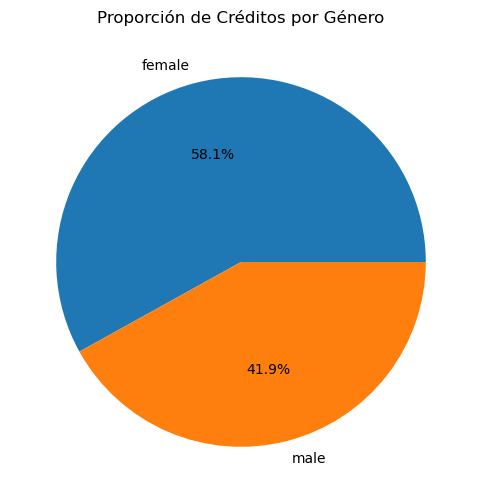

In [26]:
%matplotlib inline
import matplotlib.pyplot as plt

# Obtener la cuenta de créditos por género
conteo_genero = df['GENERO'].value_counts()

# Crear el gráfico de pastel
plt.figure(figsize=(6, 6))
plt.pie(conteo_genero, labels=conteo_genero.index, autopct='%1.1f%%')
plt.title('Proporción de Créditos por Género')

# Mostrar el gráfico
plt.show()


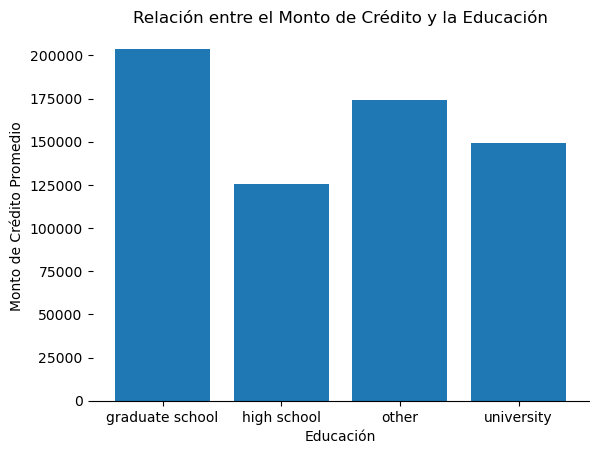

In [27]:


# Calcular la media del MONTO DE CRÉDITO agrupado por EDUCACIÓN
mean_credit_amount = df.groupby("EDUCACION")["MONTO_CREDITO"].mean()

# Crear el gráfico de barras
plt.bar(mean_credit_amount.index, mean_credit_amount)
plt.xlabel("Educación")
plt.ylabel("Monto de Crédito Promedio")
plt.title("Relación entre el Monto de Crédito y la Educación")
plt.show()


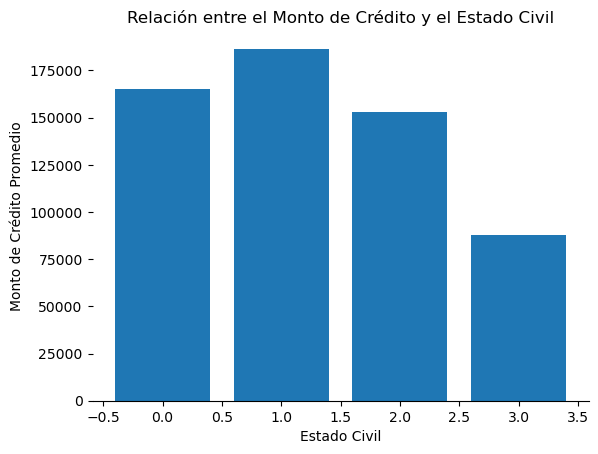

In [28]:

# Calcula la media del MONTO DE CRÉDITO agrupado por ESTADO_CIVIL
mean_credit_amount = df.groupby("ESTADO_CIVIL")["MONTO_CREDITO"].mean()

# Crea el gráfico de barras
plt.bar(mean_credit_amount.index, mean_credit_amount)
plt.xlabel("Estado Civil")
plt.ylabel("Monto de Crédito Promedio")
plt.title("Relación entre el Monto de Crédito y el Estado Civil")
plt.show()



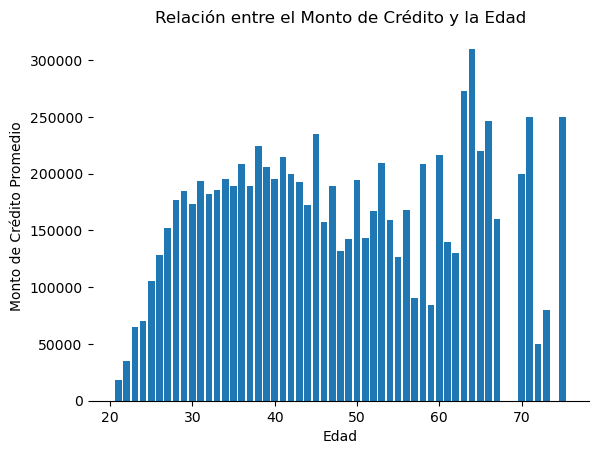

In [29]:

# Calcula la media del MONTO DE CRÉDITO agrupado por EDAD
mean_credit_amount = df.groupby("EDAD")["MONTO_CREDITO"].mean()

# Crea el gráfico de barras
plt.bar(mean_credit_amount.index, mean_credit_amount)
plt.xlabel("Edad")
plt.ylabel("Monto de Crédito Promedio")
plt.title("Relación entre el Monto de Crédito y la Edad")
plt.show()

<h2 style=color: #008B8B> Resumen detallado de los Gráficos </h2>
</br>
<p style= "text-align:justify"> En el siguiente análisis, se detalla una descripción de los datos
representados en los gráficos anteriores: 
    
<li>Gráfico. Proporción de crédito por género: En este caso los resultados indican que existe un mayor procentage de hombres que de mujeres que han accedido a un crédito.
     
 <li>Gráfico. Relación entre el monto de crédito y educación: en el tema de educación se evivdencia un mayor porcentaje de personas con escolaridad primaria que acceden a un crédito, además se osberva que en minoría las personas con grado acadméico universitario optan por uno. 
 <li>Gráfico. Relación entre el monto de crédito y el estado civil: se osberva un mayor porcentaje de personas casadas quienes acceden a un crédito, a diferencia de las personas divorcidadas, quienes representan la minoría en este caso. 
 <li>Gráfico. Relación entre el monto de crédito y la edad:  según se observa, las edades oscilan entre los 20 a 75 años en adelante, donde se osberva que la mayor cantidad de personas que acceden a un crédito se encuentran entre el grupo de edad de los 60 a 70 años y que la minoría se refleja entre los 20 y 30 años de edad. 
</p>
</br>

In [31]:
print(df.columns)

Index(['Unnamed: 0', 'MONTO_CREDITO', 'GENERO', 'EDUCACION', 'ESTADO_CIVIL',
       'EDAD', 'REMBOLSO_SEPTIEMBRE', 'REMBOLSO_AGOSTO', 'REMBOLSO_JULIO',
       'REMBOLSO_JUNIO', 'REMBOLSO_MAYO', 'REMABOLSO_ABRIL', 'FACT_SEPT',
       'FACT_AGOST', 'FACT_JUL', 'FACT_JUN', 'FACT_MAY', 'FACT_ABRIL',
       'PAGO_SEPT', 'PAGO_AGOST', 'PAGO_JUL', 'PAGO_JUN', 'PAGO_MAY',
       'PAGO_ABR', 'default payment next month'],
      dtype='object')


<h2 style=color: #008B8B> Reducción de características</h2>

In [32]:
import pandas as pd
from sklearn.decomposition import PCA

# Se debe leer el archivo Excel y asignar nombres a las columnas
names = ['MONTO_CREDITO', 'GENERO', 'EDUCACION', 'ESTADO_CIVIL',
       'EDAD', 'REMBOLSO_SEPTIEMBRE', 'REMBOLSO_AGOSTO', 'REMBOLSO_JULIO',
       'REMBOLSO_JUNIO', 'REMBOLSO_MAYO', 'REMABOLSO_ABRIL', 'FACT_SEPT',
       'FACT_AGOST', 'FACT_JUL', 'FACT_JUN', 'FACT_MAY', 'FACT_ABRIL',
       'PAGO_SEPT', 'PAGO_AGOST', 'PAGO_JUL', 'PAGO_JUN', 'PAGO_MAY',
       'PAGO_ABR', 'default payment next month']

df = pd.read_excel("df.xlsx", names=names)

# Se utiliza para convertir columnas categóricas en valores numéricos 
df = pd.get_dummies(df, columns=["GENERO", "EDUCACION"])

# Procedimiento para obtener la matriz de características (X) y la variable objetivo (Y)
array = df.values
X = array[:, 0:9]  # Ajustar el número de columnas según mis datos
Y = array[:, 9]    # Ajustar el índice de la columna target según mis datos

# Feature extraction utilizando PCA
pca = PCA(n_components=2)
fit = pca.fit(X)

# Resumen de los componentes principales
print("Explained Variance: %s" % fit.explained_variance_ratio_)
print(fit.components_)


Explained Variance: [9.99999994e-01 5.18018181e-09]
[[ 1.00000000e+00 -5.80000222e-07  1.15383687e-05 -1.68534680e-06
  -2.28708790e-06 -2.29307154e-06 -2.08282717e-06 -1.99781316e-06
  -2.03256176e-06]
 [-1.15334030e-05 -2.29402461e-02  9.99725871e-01  9.98182124e-04
   2.13659888e-04 -9.10860117e-04  1.38825447e-03  2.95116893e-03
   3.06918486e-03]]


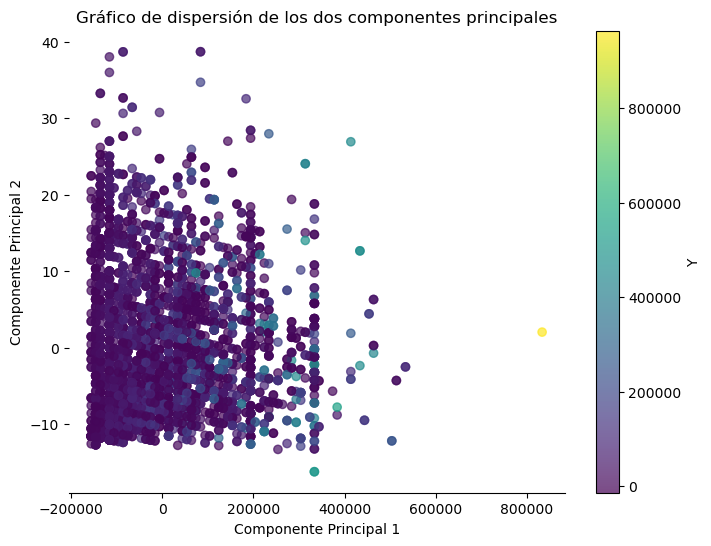

In [33]:
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt


pca = PCA(n_components=2)
X_2d = pca.fit_transform(X) 

# Para visualizar los datos en un gráfico de dispersión
plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_2d[:, 0], X_2d[:, 1], c=Y, cmap='viridis', alpha=0.7)
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Gráfico de dispersión de los dos componentes principales')
plt.colorbar(scatter, label='Y')  # Barra de color para mostrar los valores de Y
plt.show()



In [34]:
pca.explained_variance_ratio_

array([9.99999994e-01, 5.18018181e-09])

La mayoría de la varianza en los datos puede ser explicada por un solo componente principal, lo que sugiere que los datos pueden estar altamente correlacionados en una dirección, ya que el primer componente principal tiene contiene casi toda la varianza en los datos. Su valor es cercano a 1, lo que sugiere que esta componente tiene prácticamente toda la información relevante en el conjunto de datos.

<h2 style=color: #008B8B> Implementación MRL</h2>

In [40]:
print(df.columns)

Index(['MONTO_CREDITO', 'ESTADO_CIVIL', 'EDAD', 'REMBOLSO_SEPTIEMBRE',
       'REMBOLSO_AGOSTO', 'REMBOLSO_JULIO', 'REMBOLSO_JUNIO', 'REMBOLSO_MAYO',
       'REMABOLSO_ABRIL', 'FACT_SEPT', 'FACT_AGOST', 'FACT_JUL', 'FACT_JUN',
       'FACT_MAY', 'FACT_ABRIL', 'PAGO_SEPT', 'PAGO_AGOST', 'PAGO_JUL',
       'PAGO_JUN', 'PAGO_MAY', 'PAGO_ABR', 'Y', 'GENERO_female', 'GENERO_male',
       'EDUCACION_graduate school', 'EDUCACION_high school', 'EDUCACION_other',
       'EDUCACION_university'],
      dtype='object')


In [56]:
# Se define la variable objetivo y
y = df['Y']  # Columna 'Y' en lugar de 'default payment next month', porque se aplicaron dummies

# Se crea un DataFrame con las dos componentes principales obtenidas a través de PCA
principalDf = pd.DataFrame(data=X_2d, columns=['principal_component_1', 'principal_component_2'])

# se concatenan las componentes principales y la variable objetivo en un DataFrame final
finalDf = pd.concat([principalDf, y], axis=1)
finalDf.head(10)

,principal_component_1,principal_component_2,Y
0,-46323.970662,-8.822438,default
1,-76323.970560,-0.484197,not default
2,-116323.970522,2.999257,not default
3,-116323.970287,22.993687,not default
4,-116323.970522,2.976317,not default
5,333676.029349,-10.211521,not default
6,-66323.970681,-11.598887,not default
7,-26323.970637,-7.038104,not default
8,-146323.970522,1.313468,not default
9,33676.029428,-1.757762,not default


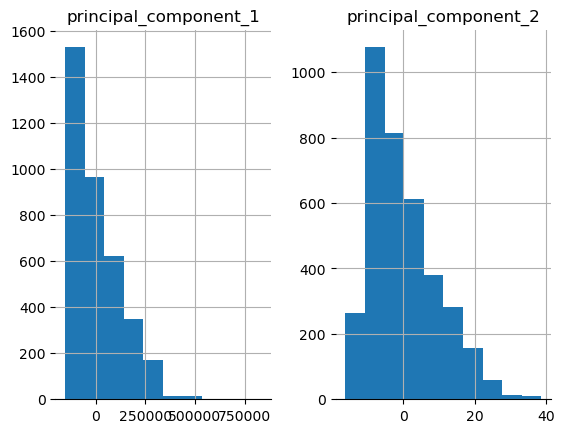

In [57]:
viz = finalDf[['principal_component_1','principal_component_2','Y']]
viz.hist()
plt.show()

In [64]:
unique_values_Y = finalDf['Y'].unique()
print(unique_values_Y)
#ser verifical el tipo de valores que existen en la columna Y

['default' 'not default' nan]


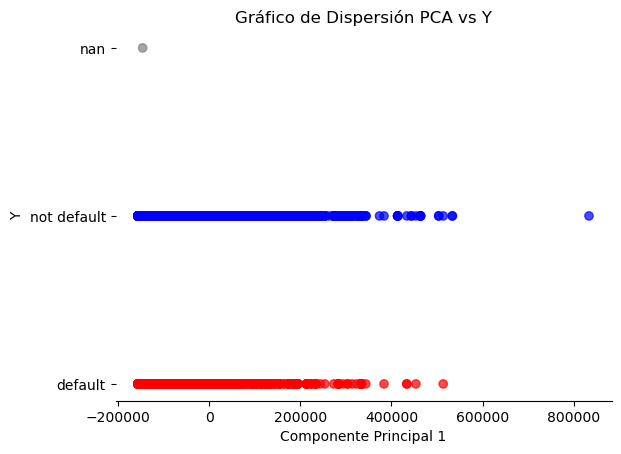

In [72]:
# Se asignan colores a las categorías
colors = {'default': 'red', 'not default': 'blue', 'nan': 'gray'}

# Se convierten los valores de la columna 'Y' a cadenas, porque algunos de sus valores eran de tipo float, 
#y esto estaba causando un error al intentar asignar colores basados en estos valores en el gráfico
finalDf['Y'] = finalDf['Y'].astype(str)

# Se cre el gráfico de dispersión, asignando colores en función de la categoría
plt.scatter(finalDf['principal_component_1'], finalDf['Y'], color=finalDf['Y'].apply(lambda x: colors.get(x, 'gray')), alpha=0.7)

# Etiquetas y títulos del Gráfico
plt.xlabel("Componente Principal 1")
plt.ylabel("Y")
plt.title("Gráfico de Dispersión PCA vs Y")
plt.show()


Posterior a generar diversos codigos para graficar al información y obtener un un MRL o MRL múltiple, se aplica PCA para visualizar el comportamiento de los datos y su distribución, no obstante dado a la conformación de la variable Y, se concluye que no es posible la implementación de un algoritmo de machine learning. 